In [1]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.colors import ListedColormap
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import MaxNLocator
import seaborn as sns
import os
import gzip
import numpy as np
import scanpy as sc
import squidpy as sq
import cupy as cp
import cupyx
from cupyx.scipy.sparse import csr_matrix 
import os
import time
import rapids_singlecell as rsc
import numpy as np
import rmm
from rmm.allocators.cupy import rmm_cupy_allocator
import cupy

rmm.reinitialize(
    managed_memory=False,  # Allows oversubscription
    pool_allocator=False,  # default is False
    devices=0,  # GPU device IDs to register. By default registers only GPU 0.
)
cp.cuda.set_allocator(rmm_cupy_allocator)
import zarr
import pickle
from collections import OrderedDict
from scipy.sparse import csr_matrix
import pandas as pd
import scipy.stats as stats
from statsmodels.stats.multitest import multipletests
from scipy.sparse import csr_matrix
import scipy
import anndata
from collections import OrderedDict
from rsc_functions.utility.applyqc import applyqc
from rsc_functions.reports.plot import plot_spatial,plot_spatial_data, plot_dist
from rsc_functions.utility.rank_genes_groups import return_markers,rank_genes_groups
from rsc_functions.reports.plot import plot_expression

In [2]:
path_016 = "/data/kanferg/Sptial_Omics/playGround/Data/Visium_HD_Human_Colon_Cancer_binned_outputs/binned_outputs/square_016um"
pathout = "/data/kanferg/Sptial_Omics/SpatialOmicsToolkit/out_2"

In [3]:
def parquet_to_csv(path):
    '''
    Converts a Parquet file to a CSV file if the CSV file does not already exist.
    '''
    file_path = os.path.join(path,'spatial/tissue_positions_list.csv')
    if not os.path.exists(file_path):
        df = pd.read_parquet(os.path.join(path,'spatial/tissue_positions.parquet'))
        # Write to a CSV file
        df.to_csv(os.path.join(path,'spatial/tissue_positions_list.csv'), index=False)
    return
parquet_to_csv(path_016)

In [4]:
andata = sc.read_visium(path=path_016)
rsc.get.anndata_to_GPU(andata)
andata.obsm['spatial'] = np.array(andata.obsm['spatial'], dtype=np.float64)
andata.var_names_make_unique()
andata.uns['config'] = OrderedDict()
andata.uns["config"]["secondary_var_names"] = andata.var_names
rsc.pp.flag_gene_family(andata, gene_family_name="MT", gene_family_prefix="MT-")
rsc.pp.calculate_qc_metrics(andata, qc_vars=["MT"])

/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/scanpy/readwrite.py:476: DtypeWarning: Columns (1,2,3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  positions = pd.read_csv(


In [5]:
andata

AnnData object with n_obs × n_vars = 137051 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_MT', 'pct_counts_MT', 'log1p_total_counts_MT'
    var: 'gene_ids', 'feature_types', 'genome', 'MT', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'
    uns: 'spatial', 'config'
    obsm: 'spatial'

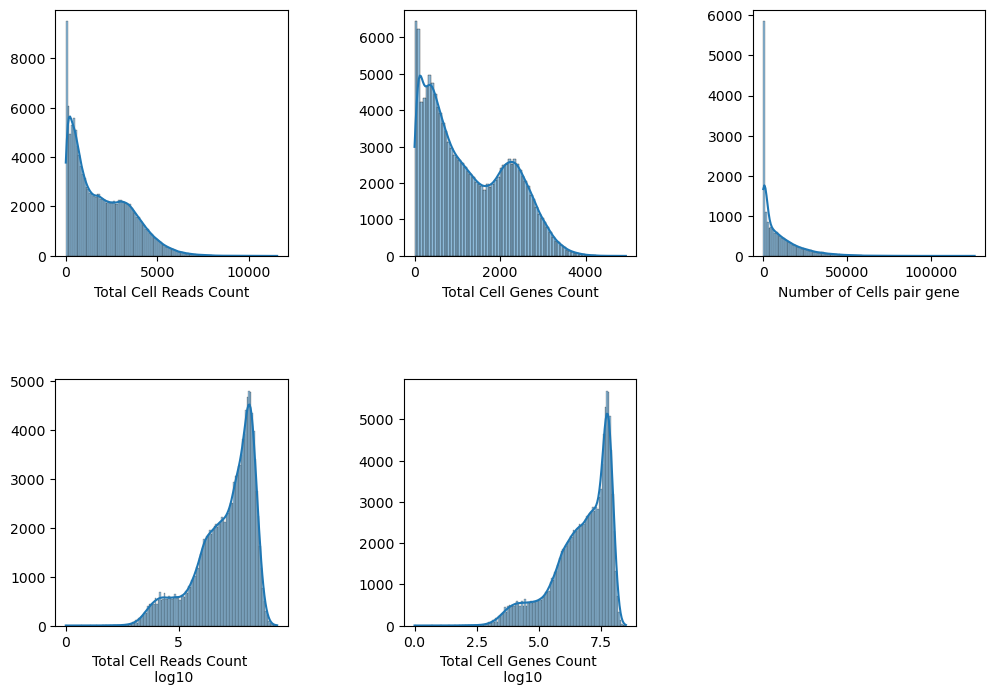

In [6]:
import warnings
# Suppress warnings in this specific code chunk
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fig, ax = plt.subplots(2, 3, figsize=(12, 8))
    ax = np.ravel(ax)
    plot_dist(andata,column = 'total_counts',ax = ax[0],xlab = 'Total Cell Reads Count')
    plot_dist(andata,column = 'n_genes_by_counts',ax = ax[1],xlab = 'Total Cell Genes Count')
    plot_dist(andata,column = 'n_cells_by_counts',bins = 'doane', type = 'var', ax = ax[2],xlab = 'Number of Cells pair gene')
    plot_dist(andata,column = 'log1p_total_counts',ax = ax[3],xlab = 'Total Cell Reads Count \n log10')
    plot_dist(andata,column = 'log1p_n_genes_by_counts',ax = ax[4],xlab = 'Total Cell Genes Count \n log10')
    ax[5].axis('off')
    plt.subplots_adjust(wspace = 0.5, hspace=0.5)

In [10]:
plt.rcParams['figure.dpi'] = 600
plt.rcParams['font.family'] = ['serif']
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
fig, ax = plt.subplots(1,1, figsize=(15, 15))
with PdfPages(os.path.join(pathout, 'Report_spatial_map_plot_Colon_total_count.pdf')) as pdf:
    plot_spatial_data(andata, 'total_counts', fig = fig , ax = ax ,set_xlabel_cbar = 'Total Count',size = 1)
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)
    pdf.savefig()
    plt.close()   

In [ ]:
plt.rcParams['figure.dpi'] = 92
plt.rcParams['font.family'] = ['serif']
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
fig, ax = plt.subplots(1, 2, figsize=(15, 15))

In [6]:
rsc.pp.filter_cells(andata, min_count=50,qc_var = 'total_counts')
rsc.pp.filter_genes(andata, min_count=50)
rsc.pp.filter_genes(andata, max_count=50_000)
andata.layers['counts'] = andata.X.copy()
rsc.pp.normalize_total(andata)
rsc.pp.log1p(andata)
andata.layers['log'] = andata.X.copy()
rsc.pp.highly_variable_genes(andata, n_top_genes=1500, flavor="seurat_v3", layer="log")
andata = andata[:, andata.var["highly_variable"]]
rsc.pp.scale(andata, max_value=10)
rsc.pp.pca(andata, n_comps=30,random_state=1337, use_highly_variable=False)

filtered out 3769 cells
filtered out 1143 genes based on n_cells_by_counts
filtered out 253 genes based on n_cells_by_counts


/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/rapids_singlecell/preprocessing/_hvg.py:517: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/rapids_singlecell/preprocessing/_scale.py:71: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


In [ ]:
sc.pl.pca_variance_ratio(andata, log=True, n_pcs=30)

In [7]:
rsc.pp.neighbors(andata, n_pcs=15, use_rep='X_pca', n_neighbors=25)
rsc.tl.leiden(andata, random_state=1337, resolution=0.5, key_added='cluster') 

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15,15))
plt.rcParams['figure.dpi'] = 800
plt.rcParams['font.family'] = ['serif']
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
clusterColorMap = plot_spatial(andata,ax = ax, features = None, title = '',markerscale = 5, xlab = '',ylab ='',size = 1,random_palette = True)
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages(os.path.join(pathout, 'Report_spatial_map_plot_Colon.pdf')) as pdf:
    fig, ax = plt.subplots(1, 1, figsize=(15,15))
    plt.rcParams['figure.dpi'] = 800
    plt.rcParams['font.family'] = ['serif']
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 12
    plt.rcParams['axes.titlesize'] = 12
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    clusterColorMap = plot_spatial(andata,ax = ax, features = None, title = '',markerscale = 5, xlab = '',ylab ='',size = 1,random_palette = True)
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)
    pdf.savefig()
    plt.close()

In [ ]:
andata.uns['clusterColorMap'] = clusterColorMap

In [8]:
rsc.get.anndata_to_CPU(andata)
sc.tl.rank_genes_groups(andata, groupby="cluster", method="wilcoxon")

/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/usr/local/apps/rapids-singlecell/mamba/envs/rapids_sing

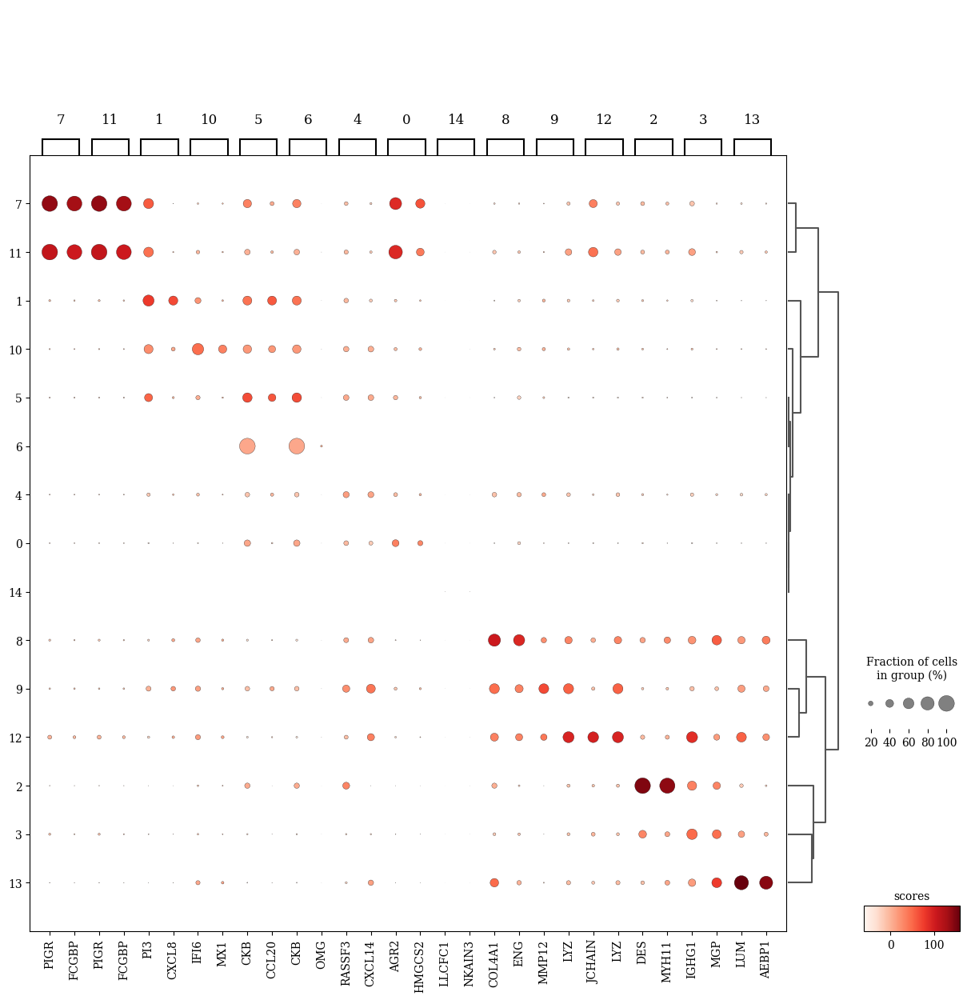

<Figure size 1920x1440 with 0 Axes>

In [9]:
fig, ax = plt.subplots(1, 1, figsize=(15,15))
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = ['serif']
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
sc.pl.rank_genes_groups_dotplot(andata, groupby="cluster",n_genes=2,values_to_plot = 'scores',ax =ax)
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)

In [ ]:
with PdfPages(os.path.join(pathout, 'dendrogram_colon.pdf')) as pdf:
    fig, ax = plt.subplots(1, 1, figsize=(15,15))
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['font.family'] = ['serif']
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 12
    plt.rcParams['axes.titlesize'] = 12
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    sc.pl.rank_genes_groups_dotplot(andata, groupby="cluster",n_genes=2,values_to_plot = 'scores',ax =ax)
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)
    pdf.savefig()
    plt.close()

In [ ]:
import squidpy as sq
sq.gr.spatial_neighbors(andata, coord_type="generic",delaunay = True)
sq.gr.nhood_enrichment(andata, cluster_key="cluster")

In [ ]:
from matplotlib.colors import LinearSegmentedColormap
with PdfPages(os.path.join(pathout, 'nhood_enrichment_colon.pdf')) as pdf:
    colors = [(0, 0, 1), (1, 1, 1), (1, 0, 0)]  # Blue -> White -> Red
    n_bins = 100  # Discretize into 100 bins
    custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', colors, N=n_bins)
    
    plt.rcParams['figure.dpi'] = 92
    plt.rcParams['font.family'] = ['serif']
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 12
    plt.rcParams['axes.titlesize'] = 12
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    
    sq.pl.nhood_enrichment(
        andata,
        title = "Neighborhood Enrichment generic",
        cluster_key="cluster",
        method="average",
        cmap=custom_cmap,
        vmin=-200,
        vmax=200,
        figsize=(5, 5),
    )
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)
    pdf.savefig()
    plt.close()

In [ ]:
from cupyx.scipy.sparse import csr_matrix
def save_matrix(matrix,pathout,file_name = "obsp_distances_large.npz"):
    cp.savez(os.path.join(pathout, file_name),  
            data=matrix.data,  
            indices=matrix.indices,  
            indptr=matrix.indptr,  
            shape=matrix.shape)
sparse_matrix = andata.obsp['distances']
save_matrix(matrix = sparse_matrix,pathout = pathout,file_name = "obsp_distances_large_colon.npz")
sparse_matrix = andata.obsp['connectivities']
save_matrix(matrix = sparse_matrix,pathout = pathout,file_name = "obsp_connectivities_large_colon.npz")

In [ ]:
import pickle
with open(os.path.join(pathout,"andata_uns_mtracies__colon.pkl"), 'wb') as buff:
     pickle.dump({'config':andata.uns['config'], 'rank_genes_groups':andata.uns['rank_genes_groups'], 'clusterColorMap':andata.uns['clusterColorMap']}, buff)

In [ ]:
andata

In [ ]:
andata_save = andata.copy()
for column in andata_save.obs.columns:
    print(f"Column '{column}' has data type: {andata_save.obs[column].dtype}")

In [ ]:
andata_save = andata.copy()
# andata_save.X = andata_save.layers['log']
del andata_save.uns
# del andata_save.obsm
del andata_save.varm
# del andata_save.layers
del andata_save.obsp
del andata_save.obs['in_tissue']
del andata_save.obs['array_row']
del andata_save.obs['array_col']
andata_save.write_h5ad(os.path.join(pathout, "andata_save_colon.h5ad"))

<center>stlearn

In [1]:
import cupy as cp
import cupyx
import scanpy as sc
import stlearn as st
import scanpy as sc
import numpy as np
from cupyx.scipy.sparse import csr_matrix
import os
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
import random
import pandas as pd

/gpfs/gsfs10/users/kanferg/conda/envs/stlearn-env/lib/python3.8/site-packages/stlearn/tools/microenv/cci/het.py:192: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit(parallel=True, nopython=False)


In [2]:
path_016 = "/data/kanferg/Sptial_Omics/playGround/Data/Visium_HD_Human_Colon_Cancer_binned_outputs/binned_outputs/square_016um"
pathout = "/data/kanferg/Sptial_Omics/SpatialOmicsToolkit/out_2"
andata = sc.read_h5ad(os.path.join(pathout, "andata_save_colon.h5ad"))
def load_matrix(andata,pathout,npz_file = "obsp_distances.npz",mode = 'sparse', mat_name = 'distances'):
    npzfile = cp.load(os.path.join(pathout, npz_file))
    data = cp.array(npzfile['data'])
    indices = cp.array(npzfile['indices'])
    indptr = cp.array(npzfile['indptr'])
    shape = tuple(npzfile['shape'])
    
    # Reconstruct the sparse matrix
    sparse_matrix_distances = csr_matrix((data, indices, indptr), shape=shape)
    if mode== 'sparse':
        andata.obsp[mat_name] = sparse_matrix_distances
    else:
        andata.obsp[mat_name] = sparse_matrix_distances.get()
    return andata

In [3]:
andata.obs["imagerow"] = andata.obsm['spatial'][:,0]
andata.obs["imagecol"] = andata.obsm['spatial'][:,1]
andata.uns["spatial"] = andata.obsm["spatial"]
def make_uns_spatial(adata):
    #max_size = np.max([adata.obs["imagerow"].max(), adata.obs["imagecol"].max()])
    #max_size = int(max_size + 0.1 * max_size)
    #image = Image.new("RGBA", (max_size, max_size), (255, 255, 255, 255))
    #imgarr = np.array(image)
    adata.uns["spatial"] = {}
    adata.uns["spatial"]["id1"] = {}
    #adata.uns["spatial"]["id1"]["images"] = {}
    #adata.uns["spatial"]["id1"]["images"]["lowres"] = imgarr
    adata.uns["spatial"]["id1"]["use_quality"] = "lowres"
    adata.uns["spatial"]["id1"]["scalefactors"] = {}
    adata.uns["spatial"]["id1"]["scalefactors"]["tissue_low_scalef" ] = 1
    adata.uns["spatial"]["id1"]["scalefactors"]["spot_diameter_fullres"] = 15
    adata.uns["spatial"]["id1"]["scalefactors"][
            "tissue_" + "lowres" + "_scalef"
        ] = 1
    return adata
andata = make_uns_spatial(andata)

In [4]:
andata = load_matrix(andata,pathout,npz_file = "obsp_distances_large_colon.npz",mode = 'sparse', mat_name = 'distances')
andata = load_matrix(andata,pathout,npz_file = "obsp_connectivities_large_colon.npz",mode = 'sparse', mat_name = 'connectivities')

In [5]:
import os
import pickle

file_path = os.path.join(pathout, "andata_uns_mtracies__colon.pkl")

if os.path.getsize(file_path) > 0:
    with open(file_path, 'rb') as buff:
        andata_uns_mtracies = pickle.load(buff)
else:
    print("File is empty. Cannot load data.")
    andata_uns_mtracies = None
andata.uns["spatial"] = andata.obsm["spatial"]
andata.uns['clusterColorMap'] = andata_uns_mtracies['clusterColorMap']
andata.obs["imagerow"] = andata.obsm['spatial'][:,0]
andata.obs["imagecol"] = andata.obsm['spatial'][:,1]
andata.uns["spatial"] = andata.obsm["spatial"]

In [7]:
andata

AnnData object with n_obs × n_vars = 133282 × 1500
    obs: 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_MT', 'pct_counts_MT', 'log1p_total_counts_MT', 'cluster', 'imagerow', 'imagecol'
    var: 'gene_ids', 'feature_types', 'genome', 'MT', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'spatial', 'clusterColorMap'
    obsm: 'X_pca', 'spatial'
    layers: 'counts', 'log'
    obsp: 'distances', 'connectivities'

In [8]:
andata.X =andata.layers['counts'].copy()

In [9]:
### Calculating the number of grid spots we will generate
n_ = 250
print(f'{n_} by {n_} has this many spots:\n', n_*n_)
### Gridding.
grid = st.tl.cci.grid(andata, n_row=n_, n_col=n_, use_label = 'cluster')
print( grid.shape ) # Slightly less than the above calculation, since we filter out spots with 0 cells.

250 by 250 has this many spots:
 62500
Gridding...
(50954, 1500)


In [10]:
# sort colors by cluster from zero to 15
andata.uns['clusterColorMap'].index = andata.uns['clusterColorMap']['clusters']
# creat a cluster list 
clusterColorMap = andata.uns['clusterColorMap'].sort_index()['colors'].to_list()

In [11]:
df = pd.DataFrame({'cluster':grid.obs['cluster'],'x':grid.obsm['spatial'][:,1],'y':grid.obsm['spatial'][:,0]}).reset_index()

# colors saved from rsc analysis step
palette = andata.uns['clusterColorMap'].sort_index()['colors'].to_list()
# palette = sns.color_palette("tab20") + sns.color_palette("tab20b") + sns.color_palette("tab20c")
# random.shuffle(palette)
# num_classes = len(df_andata['cluster'].unique())
# extended_palette = palette * (num_classes // len(palette) + 1)
# extended_palette = extended_palette[:num_classes]
# listed_cmap = ListedColormap(extended_palette)

clusters = sorted(np.unique(df['cluster'].values), key=int)

sns.set_theme(style="whitegrid")
plt.rcParams['figure.dpi'] = 800
plt.rcParams['font.family'] = ['serif']
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
fig, axes = plt.subplots(1, 1, figsize=(15, 15))
for i, cluster in enumerate(clusters):
    cluster_grid = df[df['cluster'] == cluster]
    axes.scatter(x=cluster_grid['x'], y=cluster_grid['y'], color=palette[i], label=f'{cluster}', s=3, alpha=1)
axes.set_xticks([])
axes.set_yticks([])
axes.set_xlabel('')
axes.set_ylabel('')
axes.set_title(f'Grid cluster dominant spots')
legend1 = axes.legend( title="Cluster",
                        bbox_to_anchor=(1.05, 1),  # Position the legend outside the plot
                        loc='upper left',
                        fontsize='small',  # Control the font size
                        title_fontsize='medium',
                        markerscale=5,  # Increase the size of the legend markers
                        frameon=False# Control the title font size
                        )
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)

In [12]:
# Loading the LR databases available within stlearn (from NATMI)
lrs = st.tl.cci.load_lrs(['connectomeDB2020_lit'], species='human')
print(len(lrs))

2293


In [13]:
# Running the analysis #
st.tl.cci.run(grid, lrs,
                  min_spots = 20, #Filter out any LR pairs with no scores for less than min_spots
                  distance=0, # None defaults to spot+immediate neighbours; distance=0 for within-spot mode
                  n_pairs=10000, # Number of random pairs to generate; low as example, recommend ~10,000
                  n_cpus=None, # Number of CPUs for parallel. If None, detects & use all available.
                  )

Calculating neighbours...
0 spots with no neighbours, 1 median spot neighbours.
Spot neighbour indices stored in adata.obsm['spot_neighbours'] & adata.obsm['spot_neigh_bcs'].
Altogether 191 valid L-R pairs


Generating backgrounds & testing each LR pair...: 100%|██████████████████████████████████████ [ time left: 00:00 ]



Storing results:

lr_scores stored in adata.obsm['lr_scores'].
p_vals stored in adata.obsm['p_vals'].
p_adjs stored in adata.obsm['p_adjs'].
-log10(p_adjs) stored in adata.obsm['-log10(p_adjs)'].
lr_sig_scores stored in adata.obsm['lr_sig_scores'].

Per-spot results in adata.obsm have columns in same order as rows in adata.uns['lr_summary'].
Summary of LR results in adata.uns['lr_summary'].


In [14]:
grid.uns['lr_summary']

,n_spots,n_spots_sig,n_spots_sig_pval
CCN2_LRP1,9499,4052,5689
COL4A1_ITGA1,8731,3984,5749
MUC2_AGR2,4683,3940,4452
MMP12_PLAUR,5249,3389,4082
MCAM_MCAM,9346,3231,4257
...,...,...,...
EFNA5_EPHA7,28,23,28
CCL3_ACKR2,24,22,24
CCL4_ACKR2,25,21,25
PRG4_TLR2,25,21,25


In [16]:
import pickle
with open(os.path.join(pathout,"grid_uns_mtracies_colon.pkl"), 'wb') as buff:
     pickle.dump({'grid_counts':grid.uns['grid_counts'], 'grid_xedges':grid.uns['grid_xedges'], 'grid_yedges':grid.uns['grid_yedges']}, buff)

In [17]:
grid_save = grid.copy()

In [18]:
grid_save.uns['cluster'].to_csv(os.path.join(pathout, "cluster.csv"))
grid_save.uns['lrfeatures'].to_csv(os.path.join(pathout, "lrfeatures.csv"))
grid_save.uns['lr_summary'].to_csv(os.path.join(pathout, "lr_summary.csv"))

In [19]:
grid_save

AnnData object with n_obs × n_vars = 50954 × 1500
    obs: 'imagecol', 'imagerow', 'n_cells', 'cluster'
    uns: 'spatial', 'cluster', 'grid_counts', 'grid_xedges', 'grid_yedges', 'lrfeatures', 'lr_summary'
    obsm: 'spatial', 'spot_neighbours', 'spot_neigh_bcs', 'lr_scores', 'p_vals', 'p_adjs', '-log10(p_adjs)', 'lr_sig_scores'

In [20]:
#del grid_save.uns['spatial']
del grid_save.uns

In [21]:
grid_save.write_h5ad(os.path.join(pathout, "grid_save_colon.h5ad"))

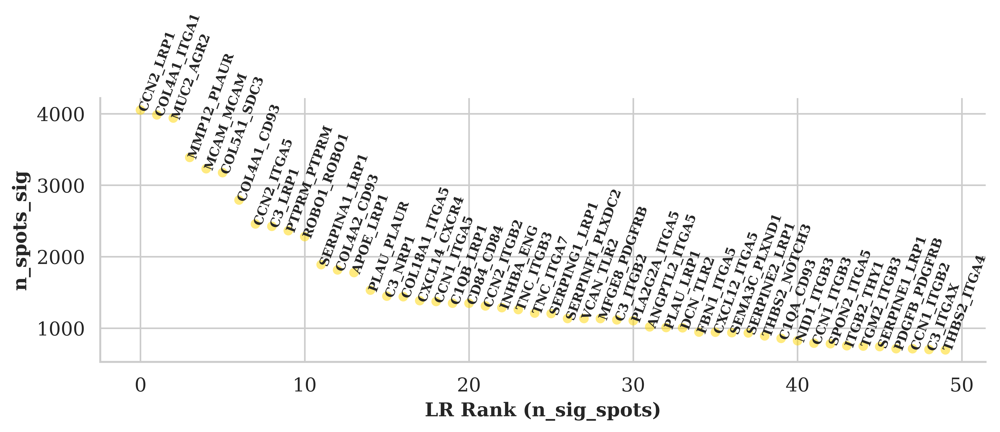

In [15]:
st.pl.lr_summary(grid, n_top=50, figsize=(10,3))

<center>voyagerpy</center>

In [28]:
import cupy as cp
import cupyx
import scanpy as sc
import scanpy as sc
import numpy as np
from cupyx.scipy.sparse import csr_matrix
import os
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
import random
import pandas as pd
import voyagerpy as vp
import geopandas as gpd
from collections import OrderedDict

In [29]:
path_016 = "/data/kanferg/Sptial_Omics/playGround/Data/Visium_HD_Human_Colon_Cancer_binned_outputs/binned_outputs/square_016um"
pathout = "/data/kanferg/Sptial_Omics/SpatialOmicsToolkit/out_2"
andata = sc.read_h5ad(os.path.join(pathout, "andata_save_colon.h5ad"))
andata

AnnData object with n_obs × n_vars = 133282 × 1500
    obs: 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_MT', 'pct_counts_MT', 'log1p_total_counts_MT', 'cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'MT', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    obsm: 'X_pca', 'spatial'
    layers: 'counts', 'log'

In [30]:
andata.uns['config'] = OrderedDict()
andata.uns['config'] = OrderedDict()
andata.uns["config"]["secondary_var_names"] = andata.var_names

In [31]:
import os
import pickle

file_path = os.path.join(pathout, "andata_uns_mtracies__colon.pkl")

if os.path.getsize(file_path) > 0:
    with open(file_path, 'rb') as buff:
        andata_uns_mtracies = pickle.load(buff)
else:
    print("File is empty. Cannot load data.")
    andata_uns_mtracies = None

In [32]:
andata.uns['clusterColorMap'] = andata_uns_mtracies['clusterColorMap']
andata.uns['rank_genes_groups'] = andata_uns_mtracies['rank_genes_groups']

In [33]:
from scipy.sparse import csr_matrix
andata_sub = andata.copy()
andata_sub.X = csr_matrix(andata_sub.X)
andata_sub = sc.pp.subsample(andata_sub, n_obs=7000,copy=True)

In [10]:
# andata_sub.obs.index = np.arange(len(andata_sub.obs.index))
# andata_sub.obs_names = andata_sub.obs_names.astype(str)
scale = 1
visium_spots = gpd.GeoSeries.from_xy(andata_sub.obsm['spatial'][:,0], andata_sub.obsm['spatial'][:,1]).scale(scale, scale, origin=(0, 0))
_ = vp.spatial.set_geometry(andata_sub, geom="spot_poly", values=visium_spots)


In [35]:
andata_sub

AnnData object with n_obs × n_vars = 7000 × 1500
    obs: 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_MT', 'pct_counts_MT', 'log1p_total_counts_MT', 'cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'MT', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'config', 'clusterColorMap', 'rank_genes_groups'
    obsm: 'X_pca', 'spatial'
    layers: 'counts', 'log'

In [36]:
andata_sub.X = andata_sub.layers['log']
sc.pp.scale(andata_sub, max_value=10)

In [37]:
sc.pp.pca(andata_sub, n_comps=15)

In [38]:
sc.pp.neighbors(
    andata_sub,
    n_neighbors=25,
    n_pcs=15,
    use_rep='X_pca',
    knn=True,
    random_state=29403943,
    method='umap', # one of umap, gauss, rapids
    metric='cosine', # many metrics available,
    key_added='knn'
)

In [39]:
dist = andata_sub.obsp['knn_distances'].copy()
#dist.data[dist.data == 0] = 0.000001
dist.data = 1 / dist.data

# row normalize the matrix, this makes the matrix dense.
dist /= dist.sum(axis=1)

# convert dist back to sparse matrix
from scipy.sparse import csr_matrix
andata_sub.obsp["knn_weights"] = csr_matrix(dist)

del dist

knn_graph = "knn_weights"

# adata.obsp["knn_connectivities"] represent the edges, while adata.opsp["knn_weights"] represent the weights
andata_sub.obsp["knn_connectivities"] = (andata_sub.obsp[knn_graph] > 0).astype(int)
vp.spatial.set_default_graph(andata_sub, "knn_weights")
vp.spatial.to_spatial_weights(andata_sub, graph_name=knn_graph)

AnnData object with n_obs × n_vars = 7000 × 1500
    obs: 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_MT', 'pct_counts_MT', 'log1p_total_counts_MT', 'cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'MT', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'config', 'clusterColorMap', 'rank_genes_groups', 'pca', 'knn', 'spatial'
    obsm: 'X_pca', 'spatial'
    varm: 'PCs'
    layers: 'counts', 'log'
    obsp: 'knn_distances', 'knn_connectivities', 'knn_weights'

In [40]:
qc_features = ["total_counts"]
morans = vp.spatial.moran(andata_sub, qc_features, graph_name=knn_graph)
andata_sub.uns['spatial']['moran'][knn_graph].loc[qc_features, ["I"]]

,I
total_counts,0.001912


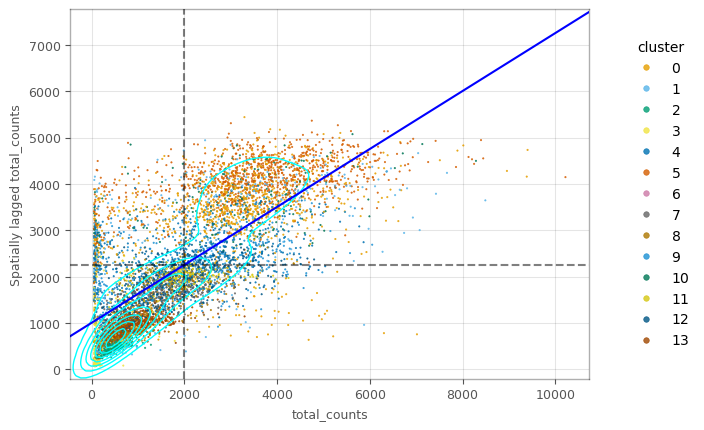

In [20]:
qc_features = ["total_counts"]
vp.spatial.compute_spatial_lag(
    andata_sub,
    qc_features,
    graph_name=knn_graph,
    inplace=True
)
ax = vp.plt.moran_plot(andata_sub, feature="total_counts", color_by='cluster', alpha=0.8,s = 1)

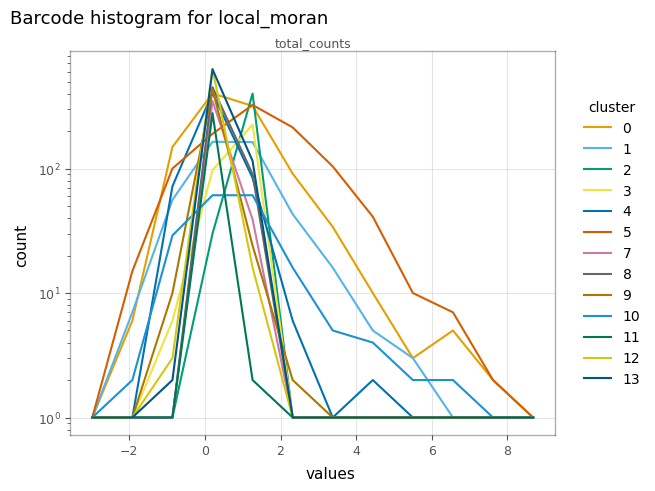

In [15]:
_ = vp.spatial.local_moran(andata_sub, qc_features, graph_name=knn_graph)
axs = vp.plt.plot_barcode_histogram(
    andata_sub,
    qc_features,
    obsm="local_moran",
    color_by='cluster',
    log=True,
    histtype='line',
    bins=10,
)

In [66]:
hvg = andata_sub.var[andata_sub.var['highly_variable'].values].index

In [67]:
andata_sub.X = csr_matrix(andata_sub.X)

In [68]:
vp.spatial.moran(andata_sub, feature=hvg, dim='var', graph_name=knn_graph)

/gpfs/gsfs10/users/kanferg/conda/envs/squidpy-voyagerpy/lib/python3.8/site-packages/esda/moran.py:227: RuntimeWarning: invalid value encountered in double_scalars
  k = k_num / k_den
/gpfs/gsfs10/users/kanferg/conda/envs/squidpy-voyagerpy/lib/python3.8/site-packages/esda/moran.py:238: RuntimeWarning: invalid value encountered in double_scalars
  return self.n / self.w.s0 * inum / self.z2ss
/gpfs/gsfs10/users/kanferg/conda/envs/squidpy-voyagerpy/lib/python3.8/site-packages/esda/moran.py:202: RuntimeWarning: invalid value encountered in true_divide
  self.z /= sy


In [69]:
hvgs_moransI = andata_sub.uns['spatial']['moran'][knn_graph].loc[hvg, 'I']
andata_sub.var.loc[hvg, "moran"] = hvgs_moransI

In [71]:
andata_sub.var.loc[hvg, ["moran"]].sort_values(by='moran')

,moran
ZCCHC24,-0.008775
JAML,-0.008358
CHST11,-0.008218
RAI14,-0.007994
NES,-0.007983
...,...
UGT2B7,NaN
PRB3,NaN
CYP19A1,NaN
AHSP,NaN


In [72]:
andata_sub.var.loc[:, ["moran"]] = np.nan_to_num(andata_sub.var.loc[:, ["moran"]],0.0)
andata_sub.var.loc[hvg, ["moran"]].sort_values(by='moran')

,moran
ZCCHC24,-0.008775
JAML,-0.008358
CHST11,-0.008218
RAI14,-0.007994
NES,-0.007983
...,...
C1QTNF3,0.011142
PGA5,0.012067
PNLIP,0.014767
NRSN1,0.015497


In [73]:
andata_sub.uns['rank_genes_groups'].keys()

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

In [74]:
pd.DataFrame(andata_sub.uns['rank_genes_groups']['names'])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,AGR2,PI3,DES,IGHG1,RASSF3,CKB,CKB,PIGR,COL4A1,MMP12,IFI6,PIGR,JCHAIN,LUM
1,HMGCS2,CXCL8,MYH11,MGP,CXCL14,CCL20,OMG,FCGBP,PECAM1,COL4A1,MX1,FCGBP,LYZ,AEBP1
2,PCP4,S100A9,ACTG2,SFRP2,PCP4,PCP4,SLC35G3,MUC2,ENG,LYZ,ISG15,OLFM4,C1QC,COL5A1
3,PLTP,CCL20,MYLK,C3,SPP1,PI3,RS1,CA2,COL4A2,C1QC,IFIT3,AGR2,IGHG1,THBS2
4,MT1X,PLAUR,SYNPO2,CCDC80,MMP12,CEACAM7,ENDOU,TSPAN1,VWF,F3,PI3,MUC2,LSP1,DCN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,LUM,ACTA2,CCN2,TSPAN1,DCN,TIMP2,COL5A1,C1R,PCP4,TSPAN1,TIMP2,COL6A3,TSPAN1,PCP4
1496,TIMP2,TIMP2,AGR2,AGR2,ACTA2,LUM,COL6A3,COL4A1,PI3,GREM1,ACTA2,PLTP,AGR2,AGR2
1497,COL5A1,LUM,TSPAN1,CXCL14,LUM,C1R,C1R,LUM,AGR2,PLA2G2A,COL5A1,THY1,PI3,TSPAN1
1498,COL6A3,COL6A3,PI3,PI3,TIMP2,COL5A1,IGFBP4,COL5A1,TSPAN1,PIGR,LUM,MGP,PCP4,PI3


In [61]:
andata_sub.uns['config']['secondary_var_names']

Index(['HES4', 'ISG15', 'MXRA8', 'ANKRD65', 'MMP23B', 'MEGF6', 'SPSB1',
       'PIK3CD', 'ANGPTL7', 'PDPN',
       ...
       'SMIM10', 'FHL1', 'BGN', 'PNCK', 'PDZD4', 'L1CAM', 'DDX3Y', 'UTY',
       'KDM5D', 'EIF1AY'],
      dtype='object', length=1500)

In [ ]:
andata_sub.var.index[adata.var[secondary_column] == genes]

In [75]:
mat_names = np.ravel(pd.DataFrame(andata_sub.uns['rank_genes_groups']['names']).values)

In [76]:
marker_genes = mat_names[:10].tolist()

In [77]:
andata_sub

AnnData object with n_obs × n_vars = 7000 × 1500
    obs: 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_MT', 'pct_counts_MT', 'log1p_total_counts_MT', 'cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'MT', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std', 'moran'
    uns: 'config', 'clusterColorMap', 'rank_genes_groups', 'pca', 'knn', 'spatial'
    obsm: 'X_pca', 'spatial'
    varm: 'PCs'
    layers: 'counts', 'log'
    obsp: 'knn_distances', 'knn_connectivities', 'knn_weights'

In [79]:
andata_sub.var['symbol'] = andata_sub.var['gene_ids'].values

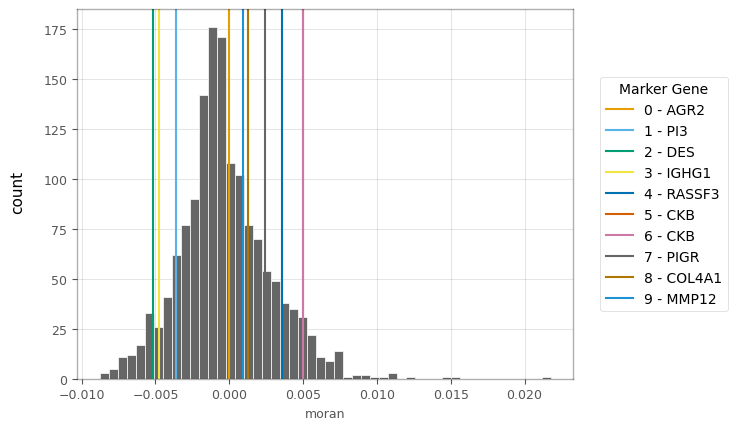

In [81]:
_ = vp.plt.plot_features_histogram(
    andata_sub,
    "moran",
    bins=50,
    log=False,
    histtype="bar",
    markers=marker_genes,
    show_symbol=False
)

In [94]:
cluster_num = len(np.unique(andata_sub.obs['cluster'].values))
cluster_num

13

In [86]:
_ = vp.spatial.local_moran(andata_sub, marker_genes, graph_name=knn_graph)

In [90]:
marker_genes_symbols = andata_sub.var.loc[marker_genes, "symbol"].tolist()
marker_genes_symbols

['ENSG00000106541',
 'ENSG00000124102',
 'ENSG00000175084',
 'ENSG00000211896',
 'ENSG00000153179',
 'ENSG00000166165',
 'ENSG00000166165',
 'ENSG00000162896',
 'ENSG00000187498',
 'ENSG00000262406']

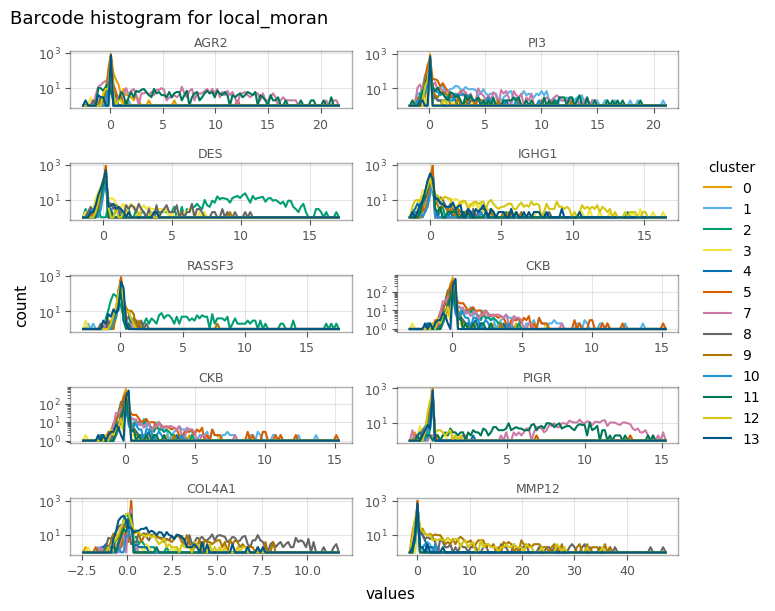

In [93]:
_ = vp.plt.plot_barcode_histogram(
    andata_sub,
    marker_genes,
    color_by='cluster',
    obsm='local_moran',
    histtype='line',
    figsize=(7,6),
    subplot_kwargs=dict(layout='constrained'),
    label=marker_genes,
    ncol=2
)
